# IMPORTING NECESSARY LIBRARIES


In [5]:
!pip install xgboost


     ---------------------------------------- 70.9/70.9 MB 3.1 MB/s eta 0:00:00


In [19]:
import numpy as np
import pandas as pd
import seaborn as sns           
import matplotlib                
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier  
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier 
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier 
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report 

#3.Exploratory Data Analysis (EDA) & Visualization

import numpy as np
import pandas as pd
import seaborn as sns           
import matplotlib                
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier  
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier 
from sklearn.ensemble import GradientBoostingClassifier 
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report   

In [20]:
# let's download the data and take a look at it
df = pd.read_csv('weatherAUS.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [21]:
# let's output five random strings
df.sample(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
1296,2010-04-03,CoffsHarbour,17.9,25.5,0.4,6.0,10.7,S,52.0,WSW,...,50.0,48.0,1019.6,1017.0,1.0,1.0,21.6,24.9,No,Yes
1234,2010-01-31,CoffsHarbour,21.6,28.2,10.8,7.4,8.4,ENE,48.0,ESE,...,79.0,68.0,1013.7,1012.6,7.0,7.0,26.1,27.1,Yes,Yes
4280,2017-06-17,Williamtown,12.8,18.4,0.0,NaN,NaN,SW,26.0,NW,...,89.0,82.0,1023.4,1020.8,8.0,8.0,14.6,17.3,No,No
4226,2017-04-24,Williamtown,12.1,24.2,0.0,NaN,NaN,ESE,26.0,NW,...,88.0,69.0,1022.6,1018.5,NaN,NaN,17.7,22.6,No,No
6073,2011-11-16,Melbourne,13.6,20.8,9.4,6.6,11.5,SSE,37.0,S,...,51.0,45.0,1019.4,1019.6,7.0,2.0,16.7,19.3,Yes,No


In [22]:
df.shape

(8425, 23)

In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [62]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [59]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [60]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


# EXPLORATORY DATA ANALYSIS AND VISUALISATION

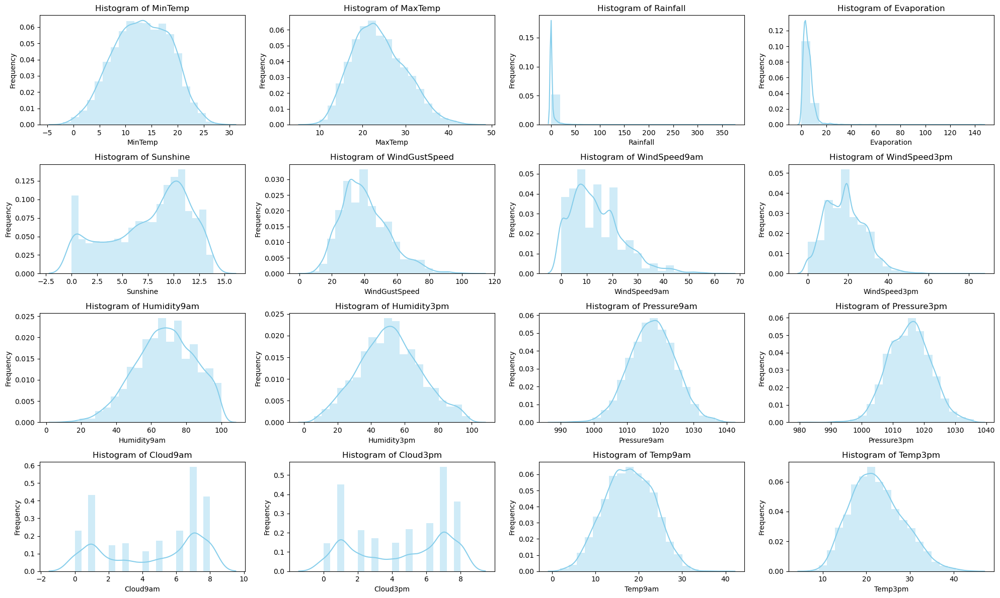

(None, None)

In [9]:
numerical_columns = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed',
                     'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
                     'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
                     'Temp9am', 'Temp3pm']
plt.figure(figsize=(20, 12))

for i, column in enumerate(numerical_columns, 1):
    plt.subplot(4, 4, i)  
    sns.distplot(df[column], bins=20, color='skyblue')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {column}')

plt.tight_layout(), plt.show()

In [9]:
let's show the distribution of RainTomorrow depending on the localization
fig=px.histogram(df, 
                 x="RainTomorrow",
                 color="Location",
                 hover_data=df.columns,
                 title="Distribution of RainTomorrow Distribution by Location",
                 barmode="group",
                )
fig.show()

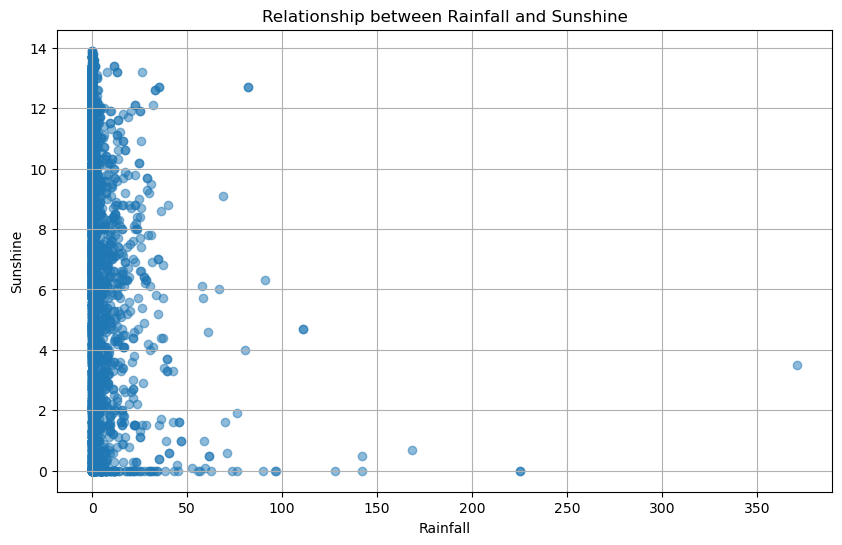

In [17]:
rainfall = df['Rainfall']
sunshine = df['Sunshine']

# scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(rainfall, sunshine, alpha=0.5)
plt.title("Relationship between Rainfall and Sunshine")
plt.xlabel("Rainfall")
plt.ylabel("Sunshine")
plt.grid(True)
plt.show()


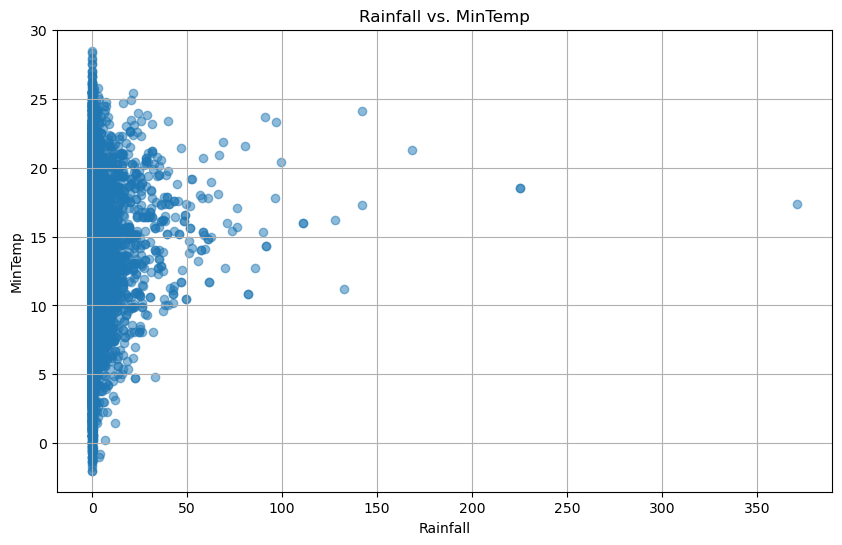

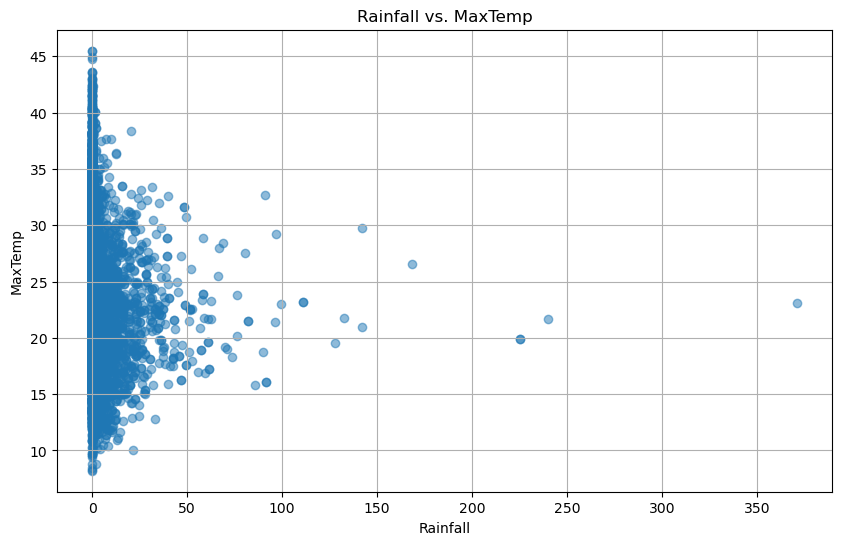

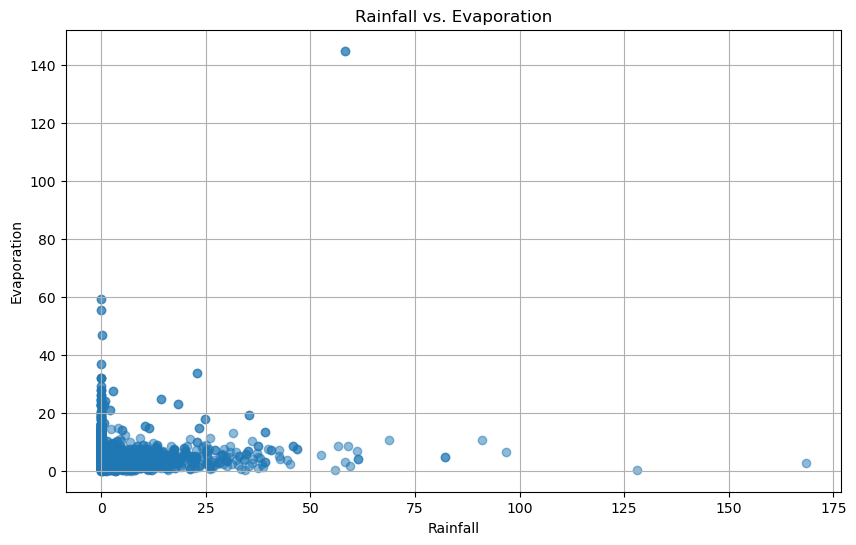

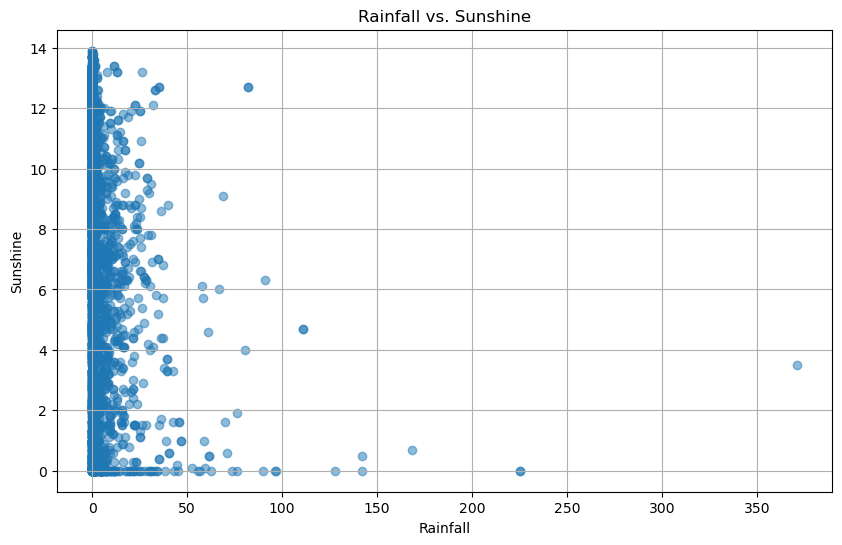

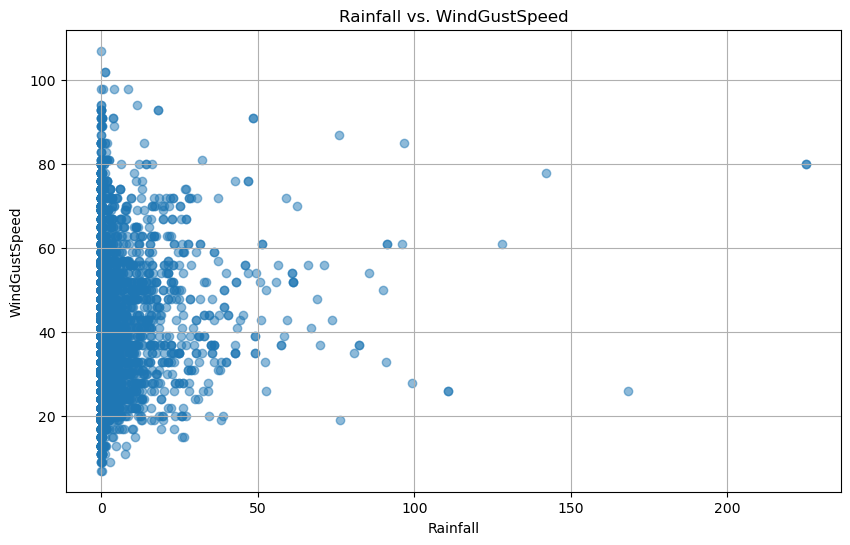

...

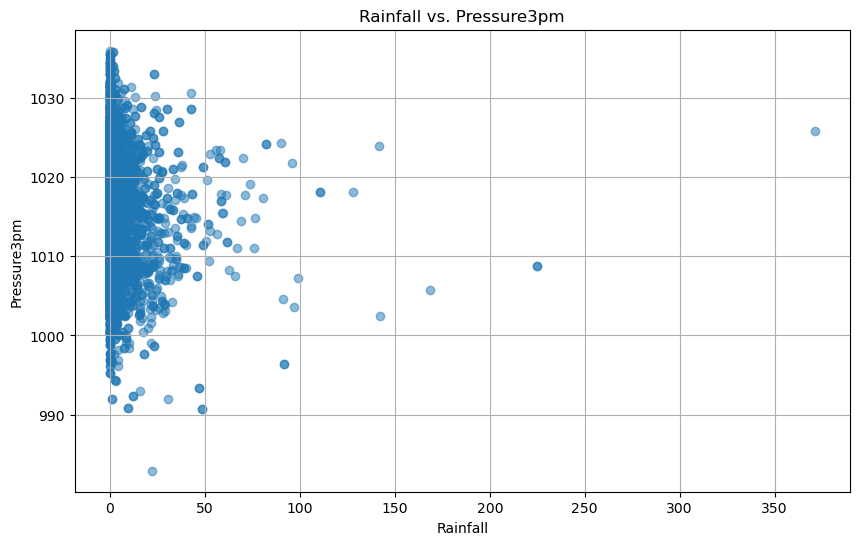

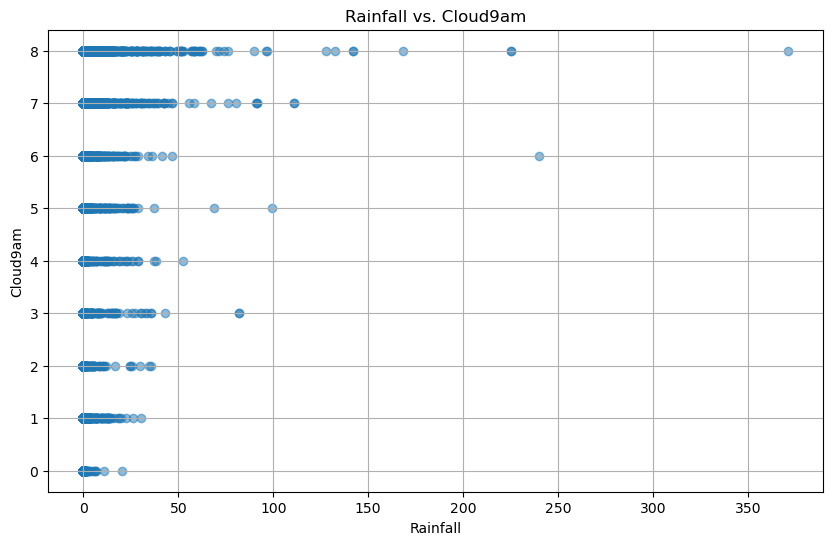

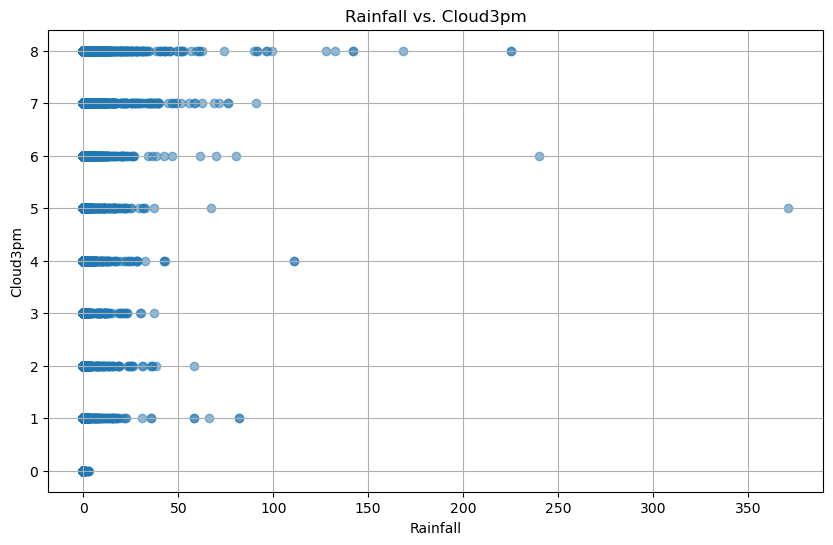

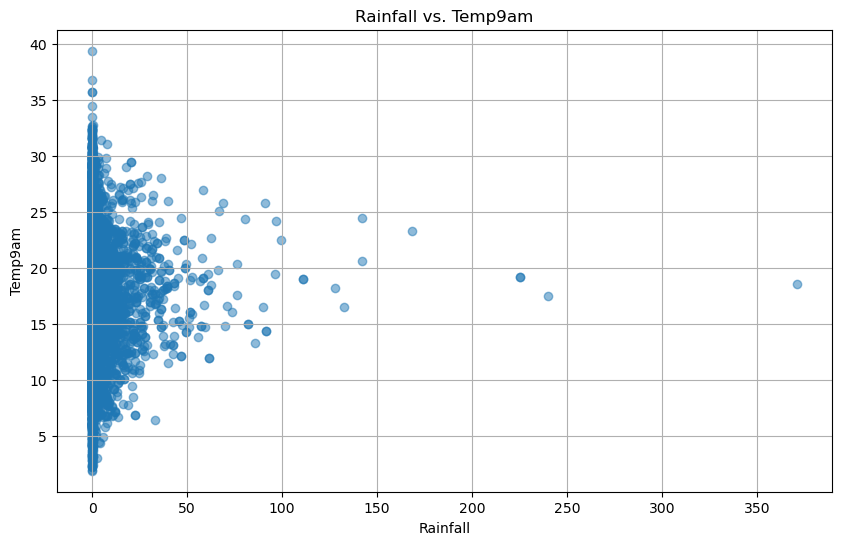

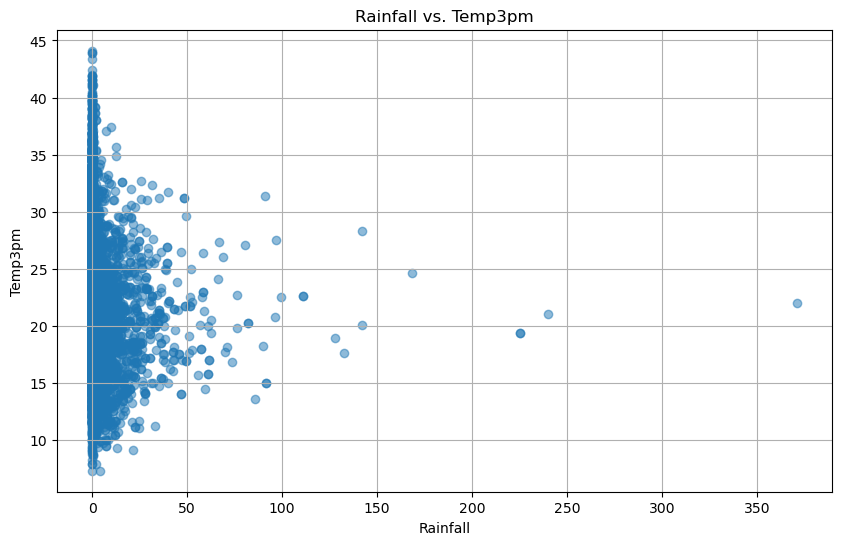

In [15]:
import matplotlib.pyplot as plt

# Extract the Rainfall column
rainfall = df['Rainfall']

# List of numerical column names (excluding Rainfall)
numerical_columns = ['MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed',
                     'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
                     'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
                     'Temp9am', 'Temp3pm']

# Create scatter plots for Rainfall vs. each numerical feature
for feature in numerical_columns:
    plt.figure(figsize=(10, 6))
    plt.scatter(rainfall, df[feature], alpha=0.5)
    plt.title(f"Rainfall vs. {feature}")
    plt.xlabel("Rainfall")
    plt.ylabel(feature)
    plt.grid(True)
    plt.show()


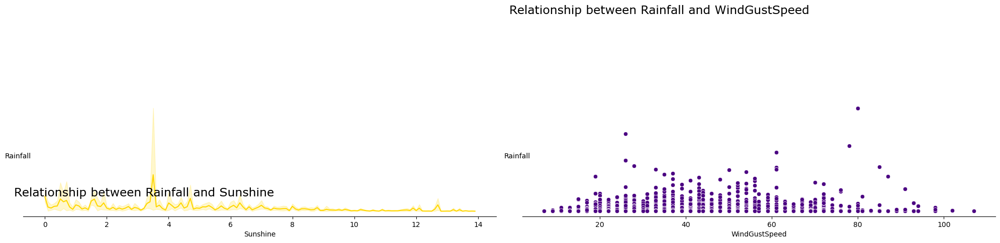

In [10]:
# Let's look at the relationship between two continuous variables

fig=plt.figure(figsize=(20,8),facecolor='white')

gs=fig.add_gridspec(1,2)

ax=[_ for _ in range(2)]
ax[0]=fig.add_subplot(gs[0,0])
ax[1]=fig.add_subplot(gs[0,1])

ax[0].text(-1,15,"Relationship between Rainfall and Sunshine",fontsize=17,fontweight='normal', fontfamily='Verdana')

ax[1].text(-1,430,"Relationship between Rainfall and WindGustSpeed",fontsize=17,fontweight='normal', fontfamily='Verdana')

sns.lineplot(data=df,x='Sunshine',y='Rainfall',ax=ax[0],color='#FFD700')
sns.scatterplot(data=df,x='WindGustSpeed',y='Rainfall',ax=ax[1],color='#4B0082')

for i in range(2):
    
    ax[i].set_ylabel('Rainfall').set_rotation(0)
    ax[i].set_yticklabels('')
    ax[i].tick_params(axis='y',length=0)
    
    for direction in ['top','right','left']:
        ax[i].spines[direction].set_visible(False)
        
plt.tight_layout()
plt.show()

<Axes: xlabel='Cloud3pm', ylabel='Rainfall'>

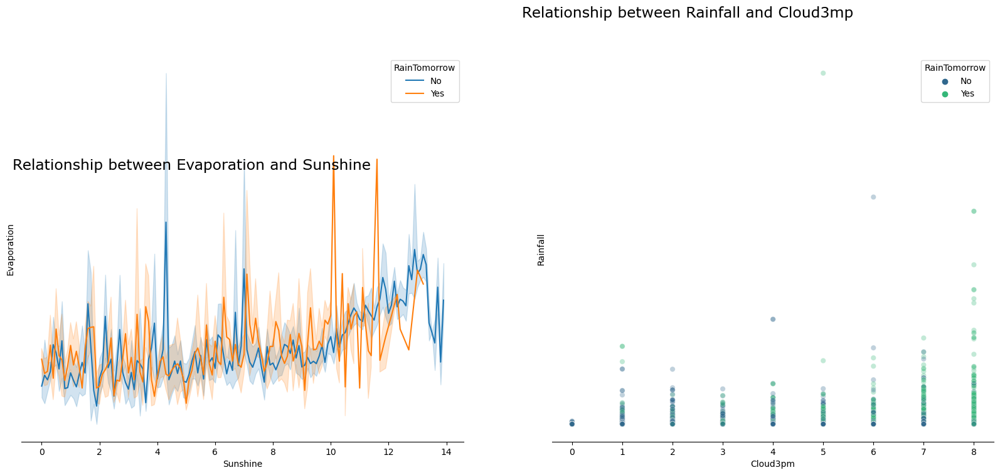

In [11]:
fig=plt.figure(figsize=(20,8),facecolor='white')

gs=fig.add_gridspec(1,2)

ax=[_ for i in range(2)]

ax[0]=fig.add_subplot(gs[0,0])
ax[1]=fig.add_subplot(gs[0,1])

ax[0].text(-1,15,"Relationship between Evaporation and Sunshine",fontsize=17,fontweight='normal', fontfamily='Verdana')

ax[1].text(-1,430,"Relationship between Rainfall and Cloud3mp",fontsize=17,fontweight='normal', fontfamily='Verdana')


for i in range(2):
    ax[i].set_yticklabels([])
    ax[i].tick_params(axis='y',length=0)
    
    for direction in ["top","right", 'left']:
        ax[i].spines[direction].set_visible(False)

sns.lineplot(data=df,x='Sunshine',y='Evaporation',ax=ax[0],hue='RainTomorrow')
sns.scatterplot(data=df,x='Cloud3pm',y='Rainfall',hue='RainTomorrow',ax=ax[1],palette='viridis',markers='o',alpha=0.3)

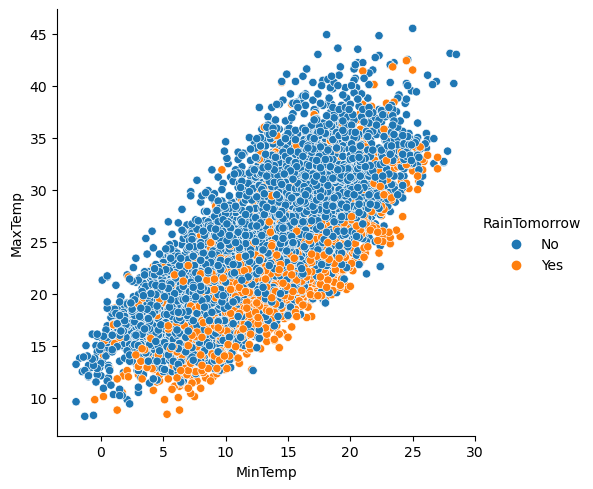

In [64]:
sns.relplot(x='MinTemp', y = 'MaxTemp', hue = "RainTomorrow", data = df)

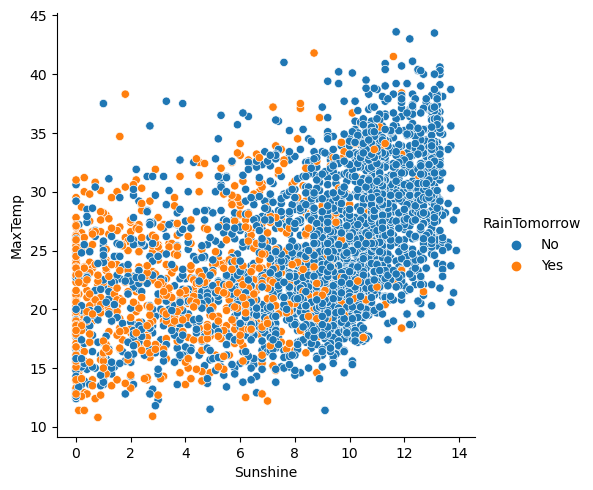

In [65]:
sns.relplot(x='Sunshine', y = 'MaxTemp', hue = "RainTomorrow", data = df)

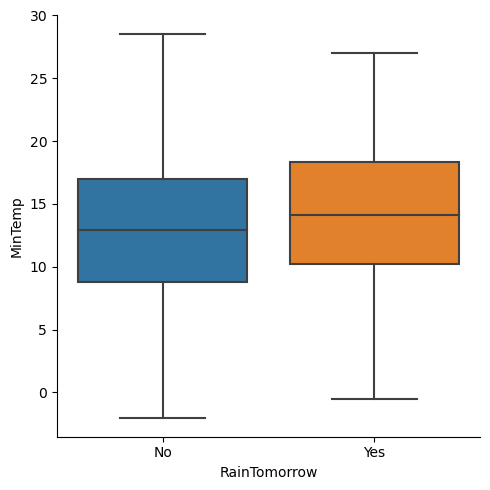

In [66]:
sns.catplot(x = 'RainTomorrow', y="MinTemp", kind="box", data = df)

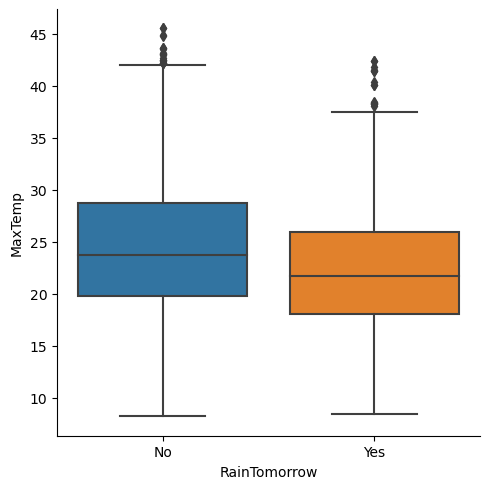

In [67]:
sns.catplot(x = 'RainTomorrow', y="MaxTemp", kind="box", data = df)

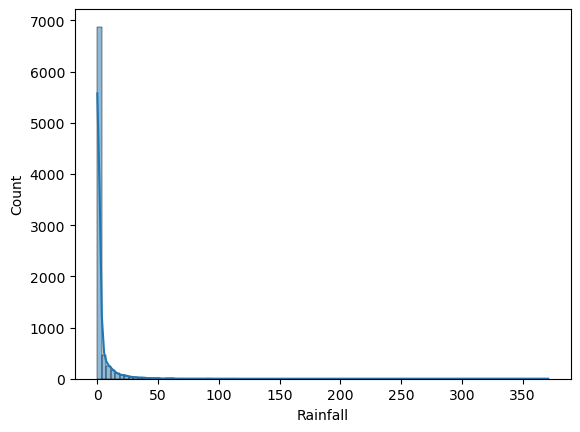

In [12]:
# Let's see how the Rainfall feature is distributed across 100 bins
sns.histplot(data = df, x = 'Rainfall', bins = 100, kde = True);

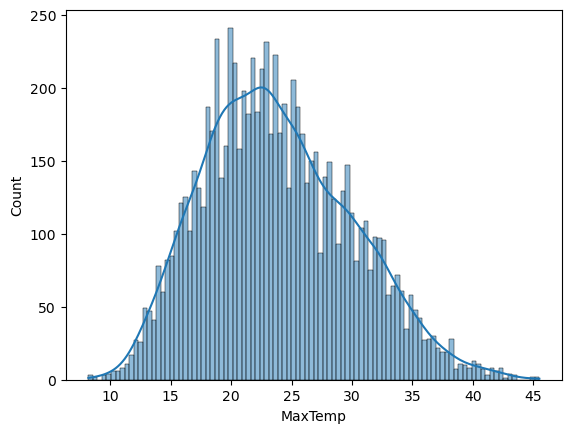

In [13]:
# Let's see how the MaxTemp feature is distributed across 100 bins
sns.histplot(data = df, x = 'MaxTemp', bins = 100, kde = True);

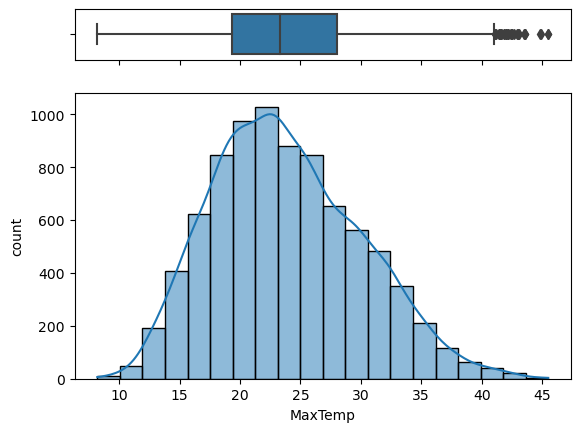

In [15]:
# Let's create a histogram, a boxplot and a density graph for Max Temp
fig, (ax_box, ax_hist) = plt.subplots(2, 
                                    sharex = True, 
                                    gridspec_kw = {'height_ratios': (.15, .85)}) 
 
sns.boxplot(x = df['MaxTemp'], ax = ax_box)
sns.histplot(x = df['MaxTemp'], ax = ax_hist, bins = 10+10, kde = True)
 
ax_box.set(xlabel = '') 
ax_hist.set(xlabel = 'MaxTemp')
ax_hist.set(ylabel = 'count')
 
plt.show()

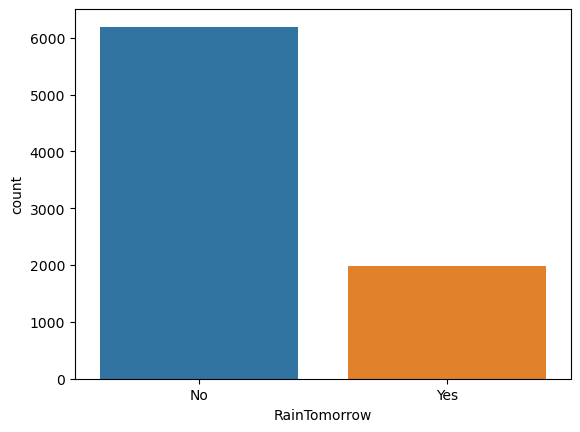

In [16]:
# the count plot() function itself will count the number of observations in each of the categories
sns.countplot(x = 'RainTomorrow', data = df);

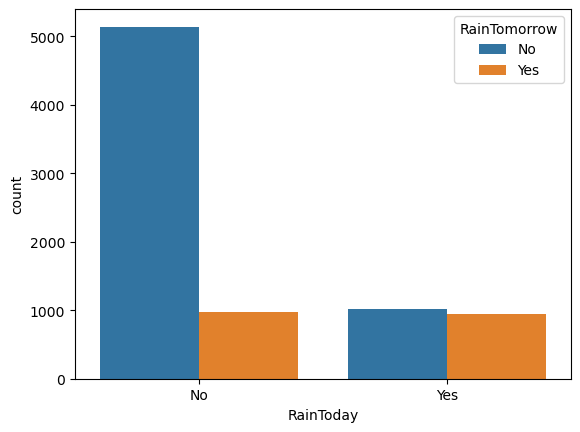

In [17]:
# Let's look at the dependence of whether it will rain tomorrow on whether it rained today
sns.countplot(x = 'RainToday', hue = 'RainTomorrow', data = df);


# Missing values in categorical attributes 

In [23]:
# Get list of categorical variables
s = (df.dtypes == "object")
object_cols = list(s[s].index)

print("Categorical variables:")
print(object_cols)

Categorical variables:
['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [26]:
# Missing values in categorical variables

for i in object_cols:
    print(i, df[i].isnull().sum())

Date 0
Location 0
WindGustDir 991
WindDir9am 829
WindDir3pm 308
RainToday 240
RainTomorrow 239


In [27]:

for i in object_cols:
    df[i].fillna(df[i].mode()[0], inplace=True)

In [28]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [29]:
# Let's convert  "Rain Today" and "RainTomorrow" into binary (1/0)
df['RainToday'].replace({'No': 0, 'Yes': 1},inplace = True)
df['RainTomorrow'].replace({'No': 0, 'Yes': 1},inplace = True)
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,0,0
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,0,0
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,0,0
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,0,0
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0


# Missing values in numeric attributes 

In [30]:
# Get list of neumeric variables
t = (df.dtypes == "float64")
num_cols = list(t[t].index)

print("Neumeric variables:")
print(num_cols)

Neumeric variables:
['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


In [31]:
# Missing values in numeric variables

for i in num_cols:
    print(i, df[i].isnull().sum())

MinTemp 75
MaxTemp 60
Rainfall 240
Evaporation 3512
Sunshine 3994
WindGustSpeed 991
WindSpeed9am 76
WindSpeed3pm 107
Humidity9am 59
Humidity3pm 102
Pressure9am 1309
Pressure3pm 1312
Cloud9am 2421
Cloud3pm 2455
Temp9am 56
Temp3pm 96


In [32]:
# Filling missing values with median of the column in value

for i in num_cols:
    df[i].fillna(df[i].median(), inplace=True)

In [33]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,4.6,8.7,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0,0
1,2008-12-02,Albury,7.4,25.1,0.0,4.6,8.7,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0,0
2,2008-12-03,Albury,12.9,25.7,0.0,4.6,8.7,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0,0
3,2008-12-04,Albury,9.2,28.0,0.0,4.6,8.7,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,0,0
4,2008-12-05,Albury,17.5,32.3,1.0,4.6,8.7,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0


In [ ]:
df.info()

In [34]:
# Let's make sure if there are missing in our data now
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [35]:
# Let's discuss categorical variables
cat_cols=df.select_dtypes(include='object').columns.to_list()
print(cat_cols)

['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']


In [36]:
# let's pass to the columns parameter the column that we want to delete
# let's delete the Date column, as we will not use it further in this project
df.drop(columns = ['Date'], inplace = True)
df.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [37]:
cat_cols=df.select_dtypes(include='object').columns.to_list()
print(cat_cols)

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']


In [38]:
print("Initial features:\n", list(df.columns), "\n")
df_dummies = pd.get_dummies(df, dtype=float)
print("Features after get_dummies:\n", list(df_dummies.columns))

Initial features:
 ['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow'] 

Features after get_dummies:
 ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow', 'Location_Adelaide', 'Location_Albury', 'Location_Brisbane', 'Location_CoffsHarbour', 'Location_Darwin', 'Location_Melbourne', 'Location_Newcastle', 'Location_Penrith', 'Location_PerthAirport', 'Location_Uluru', 'Location_Williamtown', 'Location_Wollongong', 'WindGustDir_E', 'WindGustDir_ENE', 'WindGustDir_ESE', 'WindGustDir_N', 'WindGustDir_NE', 'WindGustDir_NNE', 'WindGustDir_NNW', 'WindGustDir_NW'

In [39]:
df_dummies.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,13.4,22.9,0.6,4.6,8.7,44.0,20.0,24.0,71.0,22.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,7.4,25.1,0.0,4.6,8.7,44.0,4.0,22.0,44.0,25.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,12.9,25.7,0.0,4.6,8.7,46.0,19.0,26.0,38.0,30.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,9.2,28.0,0.0,4.6,8.7,24.0,11.0,9.0,45.0,16.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,17.5,32.3,1.0,4.6,8.7,41.0,7.0,20.0,82.0,33.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [40]:
df_dummies.shape

(8425, 78)

In [41]:
df_dummies.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,...,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.194255,23.855988,2.725982,5.060332,8.138409,40.036320,13.840000,18.539585,67.823739,51.246766,...,0.036320,0.055549,0.088071,0.133056,0.073947,0.043917,0.058635,0.054837,0.057804,0.068843
std,5.379497,6.114697,10.319872,3.871619,2.875324,13.781296,10.128896,9.704899,16.774237,18.311914,...,0.187097,0.229062,0.283415,0.339656,0.261699,0.204922,0.234954,0.227675,0.233387,0.253202
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9.300000,19.300000,0.000000,4.000000,8.400000,31.000000,6.000000,11.000000,56.000000,39.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,17.300000,28.000000,0.800000,5.200000,8.900000,48.000000,20.000000,24.000000,80.000000,63.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


<Axes: >

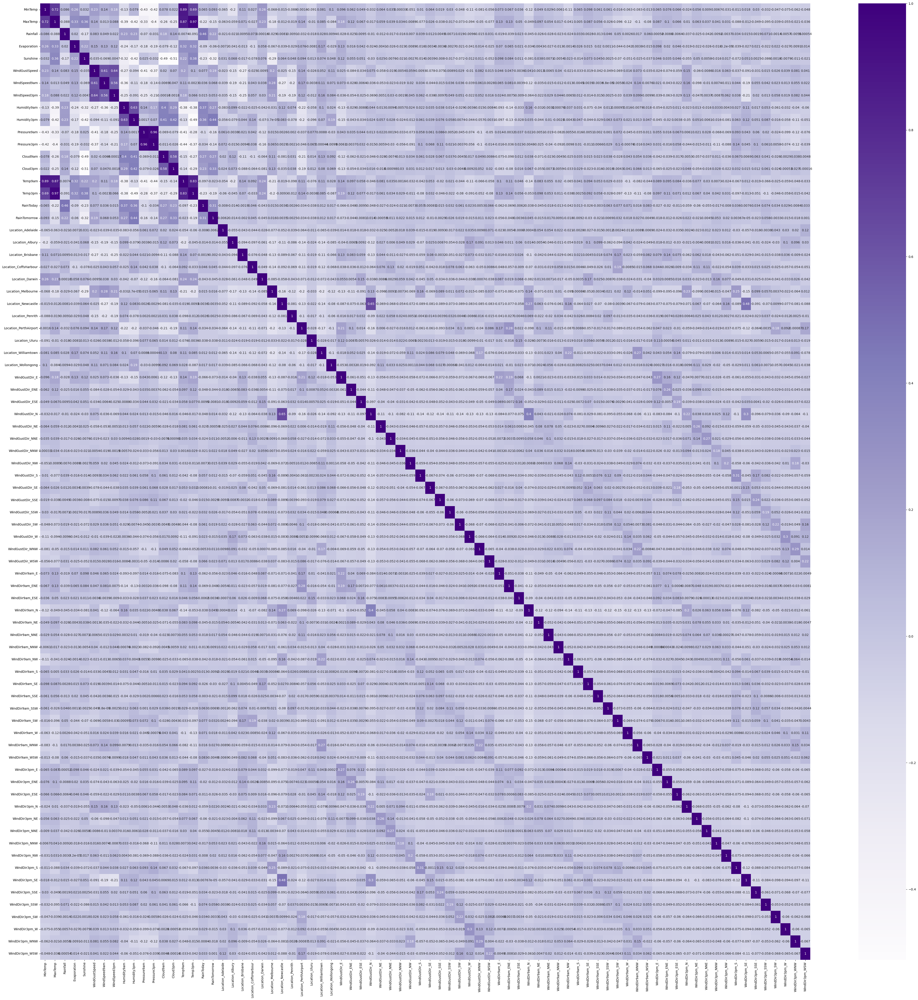

In [35]:
# Let's build a correlation matrix
cmap = sns.diverging_palette(70,20,s=50, l=40, n=6,as_cmap=True)
corrmat= df_dummies.corr()
f, ax = plt.subplots(figsize=(55,55))
sns.heatmap(corrmat, annot=True, cmap='Purples')

# 5.Model Building & TRAINING

In [42]:
# Extracting NumPy arrays X and y
X= df_dummies.drop(["RainTomorrow"],axis =1)
y= df_dummies["RainTomorrow"]
X= X.values
print(X.shape)
print(X.dtype)
X

(8425, 77)
float64


array([[13.4, 22.9,  0.6, ...,  0. ,  1. ,  0. ],
       [ 7.4, 25.1,  0. , ...,  0. ,  0. ,  1. ],
       [12.9, 25.7,  0. , ...,  0. ,  0. ,  1. ],
       ...,
       [ 5.4, 26.9,  0. , ...,  0. ,  1. ,  0. ],
       [ 7.8, 27. ,  0. , ...,  0. ,  0. ,  0. ],
       [14.9, 23.3,  0. , ...,  0. ,  0. ,  0. ]])

In [43]:
# Extracting NumPy arrays X and y
y= y.values
print(y.shape)
print(y.dtype)
y

(8425,)
int64


array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [44]:
# Let's split the data set into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=7)

In [49]:
knn = KNeighborsClassifier(n_neighbors=10)                     
tree = DecisionTreeClassifier(random_state=0)                  
rf = RandomForestClassifier(n_estimators=10, random_state=5)   
gbrt = GradientBoostingClassifier(random_state=10)             
xgbr =XGBClassifier(random_state=42)                       

In [47]:
# Preprocessing by scaling Standard Scaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

### KNN model

Model KNN:

1. Accuracy: 0.78
2. Precision: 0.68
3. Recall: 0.22
4. f1-measure: 0.33
5. Average Precision: 0.542


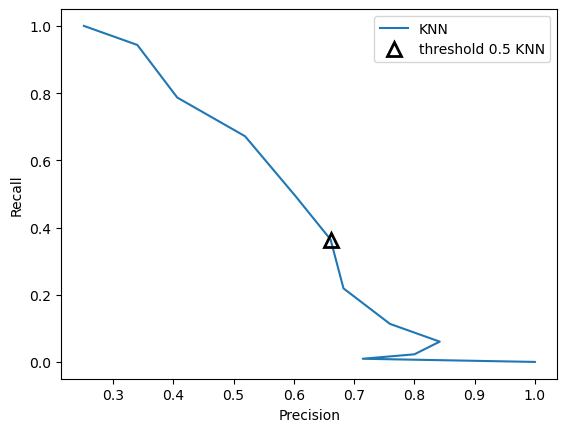

In [53]:
knn.fit(X_train_scaled, y_train)
knn.score(X_test_scaled, y_test)
acc_Knn = knn.score(X_test_scaled, y_test)
pred_Knn = knn.predict(X_test_scaled)

print("Model KNN:\n")
print("1. Accuracy: {:.2f}".format(acc_Knn))

precision_Knn = precision_score(y_test, pred_Knn)
print("2. Precision: {:.2f}".format(precision_Knn))

recall_Knn = recall_score(y_test, pred_Knn)
print("3. Recall: {:.2f}".format(recall_Knn))

print("4. f1-measure: {:.2f}".format(f1_score(y_test, pred_Knn)))

predict_proba_Knn = knn.predict_proba(X_test_scaled)[:, 1]
precision_Knn, recall_Knn, thresholds_Knn = precision_recall_curve(y_test, predict_proba_Knn)


# threshold close to zero
plt.plot(precision_Knn, recall_Knn, label="KNN")
close_default_Knn = np.argmin(np.abs(thresholds_Knn - 0.5))
plt.plot(precision_Knn[close_default_Knn], recall_Knn[close_default_Knn], '^', c='k', markersize=10, label="threshold 0.5 KNN", fillstyle="none", mew=2)
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.legend(loc="best")

ap_Knn = average_precision_score(y_test, predict_proba_Knn)
print("5. Average Precision: {:.3f}".format(ap_Knn))

6. ROC AUC: 0.792
7. Confusion matrix:
[[1523   54]
 [ 414  116]]
8. Classification Report:
                   precision    recall  f1-score   support

No RainTomorrow       0.79      0.97      0.87      1577
   RainTomorrow       0.68      0.22      0.33       530

       accuracy                           0.78      2107
      macro avg       0.73      0.59      0.60      2107
   weighted avg       0.76      0.78      0.73      2107



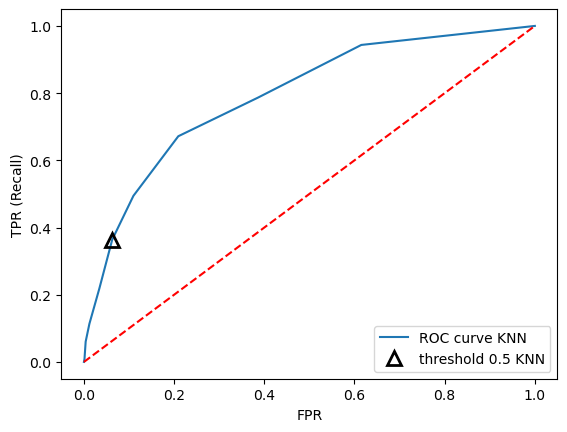

In [54]:
fpr_Knn, tpr_Knn, thresholds_Knn = roc_curve(y_test, predict_proba_Knn)
plt.plot(fpr_Knn, tpr_Knn, label="ROC curve KNN")
plt.xlabel("FPR")
plt.ylabel("TPR (Recall)")
close_default_Knn = np.argmin(np.abs(thresholds_Knn - 0.5))
plt.plot(fpr_Knn[close_default_Knn], tpr_Knn[close_default_Knn], '^', markersize=10, label="threshold 0.5 KNN", fillstyle="none", c='k', mew=2)
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],'r--')
roc_auc_Knn = roc_auc_score(y_test, predict_proba_Knn)
print("6. ROC AUC: {:.3f}".format(roc_auc_Knn))

confusion = confusion_matrix(y_test, pred_Knn)
print("7. Confusion matrix:\n{}".format(confusion))

print("8. Classification Report:\n ", classification_report(y_test, pred_Knn, target_names=["No RainTomorrow", "RainTomorrow"]))

### DecisionTree model

Model DecisionTree:

1. Accuracy: 0.84
2. Precision: 0.70
3. Recall: 0.66
4. f1-measure: 0.68
5. Average Precision: 0.547


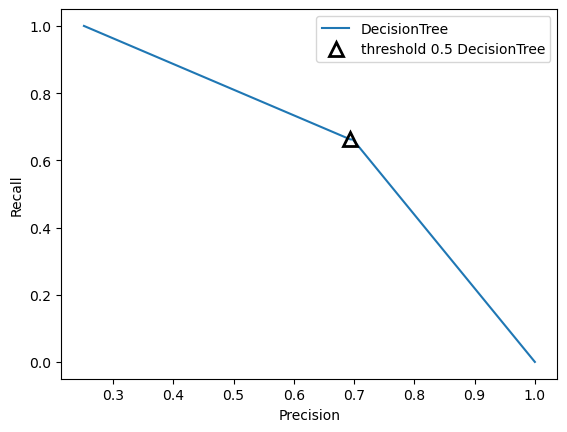

In [56]:
tree.fit(X_train_scaled, y_train)
tree.score(X_test_scaled, y_test)
acc_tree = tree.score(X_test_scaled, y_test)
pred_tree = tree.predict(X_test_scaled)

print("Model DecisionTree:\n")
print("1. Accuracy: {:.2f}".format(acc_tree))

precision_tree = precision_score(y_test, pred_tree)
print("2. Precision: {:.2f}".format(precision_tree))

recall_tree = recall_score(y_test, pred_tree)
print("3. Recall: {:.2f}".format(recall_tree))

print("4. f1-measure: {:.2f}".format(f1_score(y_test, pred_tree)))

predict_proba_tree = tree.predict_proba(X_test_scaled)[:, 1]
precision_tree, recall_tree, thresholds_tree = precision_recall_curve(y_test, predict_proba_tree)

# threshold closest to zero
plt.plot(precision_tree, recall_tree, label="DecisionTree")
close_default_tree = np.argmin(np.abs(thresholds_tree - 0.5))
plt.plot(precision_tree[close_default_tree], recall_tree[close_default_tree], '^', c='k', markersize=10, label="threshold 0.5 DecisionTree", fillstyle="none", mew=2)
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.legend(loc="best")

ap_tree = average_precision_score(y_test, predict_proba_tree)
print("5. Average Precision: {:.3f}".format(ap_tree))

6. ROC AUC: 0.783
7. Confusion matrix:
[[1425  152]
 [ 179  351]]
8. Classification Report:
                   precision    recall  f1-score   support

No RainTomorrow       0.89      0.90      0.90      1577
   RainTomorrow       0.70      0.66      0.68       530

       accuracy                           0.84      2107
      macro avg       0.79      0.78      0.79      2107
   weighted avg       0.84      0.84      0.84      2107



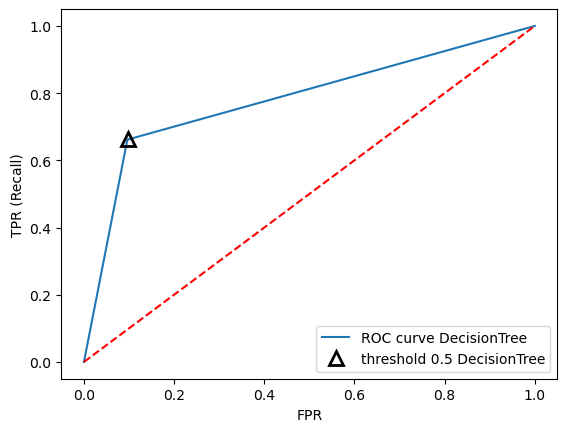

In [57]:
fpr_tree, tpr_tree, thresholds_tree = roc_curve(y_test, predict_proba_tree)
plt.plot(fpr_tree, tpr_tree, label="ROC curve DecisionTree")
plt.xlabel("FPR")
plt.ylabel("TPR (Recall)")
close_default_tree = np.argmin(np.abs(thresholds_tree - 0.5))
plt.plot(fpr_tree[close_default_tree], tpr_tree[close_default_tree], '^', markersize=10, label="threshold 0.5 DecisionTree", fillstyle="none", c='k', mew=2)
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],'r--')
roc_auc_tree = roc_auc_score(y_test, predict_proba_tree)
print("6. ROC AUC: {:.3f}".format(roc_auc_tree))

confusion = confusion_matrix(y_test, pred_tree)
print("7. Confusion matrix:\n{}".format(confusion))

print("8. Classification Report:\n ", classification_report(y_test, pred_tree, target_names=["No RainTomorrow", "RainTomorrow"]))

### RandomForest model

Model RandomForest:

1. Accuracy: 0.87
2. Precision: 0.86
3. Recall: 0.57
4. f1-measure: 0.68
5. Average Precision: 0.758


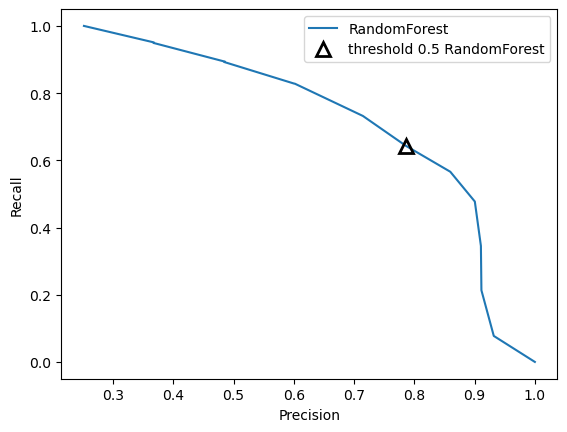

In [58]:
rf.fit(X_train_scaled, y_train)
rf.score(X_test_scaled, y_test)
acc_rf = rf.score(X_test_scaled, y_test)
pred_rf = rf.predict(X_test_scaled)

print("Model RandomForest:\n")
print("1. Accuracy: {:.2f}".format(acc_rf))

precision_rf = precision_score(y_test, pred_rf)
print("2. Precision: {:.2f}".format(precision_rf))

recall_rf = recall_score(y_test, pred_rf)
print("3. Recall: {:.2f}".format(recall_rf))

print("4. f1-measure: {:.2f}".format(f1_score(y_test, pred_rf)))

predict_proba_rf = rf.predict_proba(X_test_scaled)[:, 1]
precision_rf, recall_rf, thresholds_rf = precision_recall_curve(y_test, predict_proba_rf)

#threshold closest to zero
plt.plot(precision_rf, recall_rf, label="RandomForest")
close_default_rf = np.argmin(np.abs(thresholds_rf - 0.5))
plt.plot(precision_rf[close_default_rf], recall_rf[close_default_rf], '^', c='k', markersize=10, label="threshold 0.5 RandomForest", fillstyle="none", mew=2)
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.legend(loc="best")

ap_rf = average_precision_score(y_test, predict_proba_rf)
print("5. Average Precision: {:.3f}".format(ap_rf))

6. ROC AUC: 0.890
7. Confusion matrix:
[[1528   49]
 [ 230  300]]
8. Classification Report:
                   precision    recall  f1-score   support

No RainTomorrow       0.87      0.97      0.92      1577
   RainTomorrow       0.86      0.57      0.68       530

       accuracy                           0.87      2107
      macro avg       0.86      0.77      0.80      2107
   weighted avg       0.87      0.87      0.86      2107



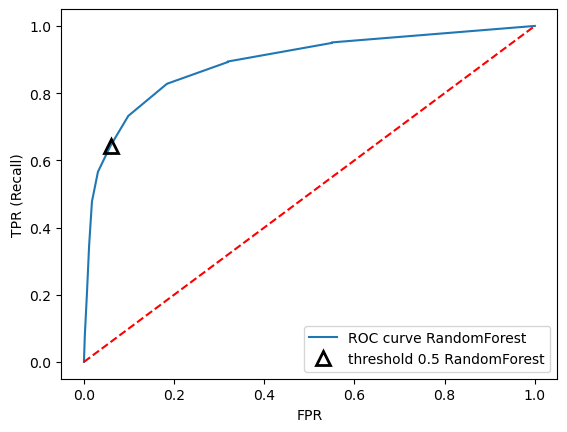

In [59]:
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, predict_proba_rf)
plt.plot(fpr_rf, tpr_rf, label="ROC curve RandomForest")
plt.xlabel("FPR")
plt.ylabel("TPR (Recall)")
close_default_rf = np.argmin(np.abs(thresholds_rf - 0.5))
plt.plot(fpr_rf[close_default_rf], tpr_rf[close_default_rf], '^', markersize=10, label="threshold 0.5 RandomForest", fillstyle="none", c='k', mew=2)
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],'r--')
roc_auc_rf = roc_auc_score(y_test, predict_proba_rf)
print("6. ROC AUC: {:.3f}".format(roc_auc_rf))

confusion = confusion_matrix(y_test, pred_rf)
print("7. Confusion matrix:\n{}".format(confusion))

print("8. Classification Report:\n ", classification_report(y_test, pred_rf, target_names=["No RainTomorrow", "RainTomorrow"]))

### GradientBoosting model

Model GradientBoosting:

1. Accuracy: 0.84
2. Precision: 0.76
3. Recall: 0.53
4. f1-measure: 0.62
5. Average Precision: 0.746


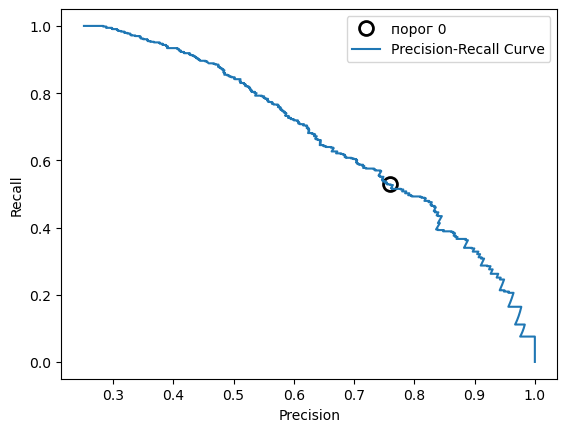

In [61]:
gbrt.fit(X_train_scaled, y_train)
gbrt.score(X_test_scaled, y_test)
acc_gbrt = gbrt.score(X_test_scaled, y_test)
pred_gbrt = gbrt.predict(X_test_scaled)

print("Model GradientBoosting:\n")
print("1. Accuracy: {:.2f}".format(acc_gbrt))

precision_gbrt = precision_score(y_test, pred_gbrt)
print("2. Precision: {:.2f}".format(precision_gbrt))

recall_gbrt = recall_score(y_test, pred_gbrt)
print("3. Recall: {:.2f}".format(recall_gbrt))

print("4. f1-measure: {:.2f}".format(f1_score(y_test, pred_gbrt)))

decision_function_gbrt = gbrt.decision_function(X_test_scaled)
precision_gbrt, recall_gbrt, thresholds_gbrt = precision_recall_curve(y_test, decision_function_gbrt)

#threshold closest to zero
close_zero = np.argmin(np.abs(thresholds_gbrt))
plt.plot(precision_gbrt[close_zero], recall_gbrt[close_zero], 'o', markersize=10, label="порог 0", fillstyle="none", c='k', mew=2)
plt.plot(precision_gbrt, recall_gbrt, label="Precision-Recall Curve")
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.legend(loc="best")


ap_gbrt = average_precision_score(y_test, decision_function_gbrt)
print("5. Average Precision: {:.3f}".format(ap_gbrt))

6. ROC AUC: 0.872
7. Confusion matrix:
[[1488   89]
 [ 250  280]]
8. Classification Report:
                   precision    recall  f1-score   support

No RainTomorrow       0.86      0.94      0.90      1577
   RainTomorrow       0.76      0.53      0.62       530

       accuracy                           0.84      2107
      macro avg       0.81      0.74      0.76      2107
   weighted avg       0.83      0.84      0.83      2107



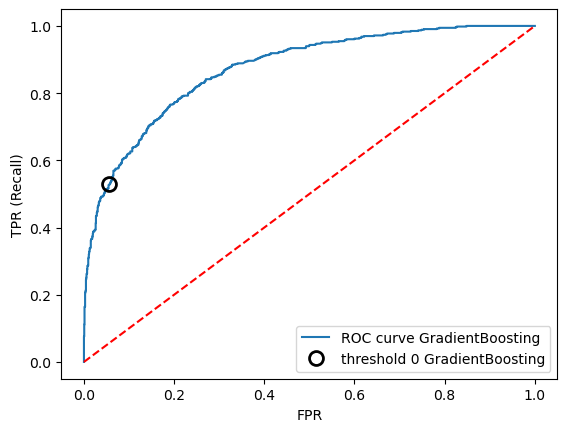

In [62]:
fpr_gbrt, tpr_gbrt, thresholds_gbrt = roc_curve(y_test, decision_function_gbrt)
plt.plot(fpr_gbrt, tpr_gbrt, label="ROC curve GradientBoosting")
plt.xlabel("FPR")
plt.ylabel("TPR (Recall)")
close_zero = np.argmin(np.abs(thresholds_gbrt))
plt.plot(fpr_gbrt[close_zero], tpr_gbrt[close_zero], 'o', markersize=10, label="threshold 0 GradientBoosting", fillstyle="none", c='k', mew=2)
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],'r--')
roc_auc_gbrt = roc_auc_score(y_test, decision_function_gbrt)
print("6. ROC AUC: {:.3f}".format(roc_auc_gbrt))

confusion = confusion_matrix(y_test, pred_gbrt)
print("7. Confusion matrix:\n{}".format(confusion))

print("8. Classification Report:\n ", classification_report(y_test, pred_gbrt, target_names=["No RainTomorrow", "RainTomorrow"]))

### XGB model

Model XGB:

1. Accuracy: 0.88
2. Precision: 0.84
3. Recall: 0.66
4. f1-measure: 0.74
5. Average Precision: 0.820


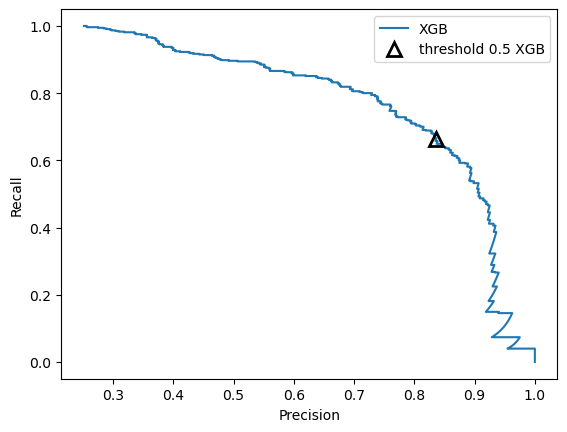

In [50]:
# Building a XGB model on scaled training data
xgbr.fit(X_train_scaled, y_train)
# Accuracy for a scaled test set
xgbr.score(X_test_scaled, y_test)
acc_xgbr = xgbr.score(X_test_scaled, y_test)
# Model prediction on test data
pred_xgbr = xgbr.predict(X_test_scaled)

print("Model XGB:\n")
print("1. Accuracy: {:.2f}".format(acc_xgbr))

precision_xgbr = precision_score(y_test, pred_xgbr)
print("2. Precision: {:.2f}".format(precision_xgbr))

recall_xgbr = recall_score(y_test, pred_xgbr)
print("3. Recall: {:.2f}".format(recall_xgbr))

print("4. f1-measure: {:.2f}".format(f1_score(y_test, pred_xgbr)))

predict_proba_xgbr = xgbr.predict_proba(X_test_scaled)[:, 1]
precision_xgbr, recall_xgbr, thresholds_xgbr = precision_recall_curve(y_test, predict_proba_xgbr)
# find the threshold closest to zero
plt.plot(precision_xgbr, recall_xgbr, label="XGB")
close_default_xgbr = np.argmin(np.abs(thresholds_xgbr - 0.5))
plt.plot(precision_xgbr[close_default_xgbr], recall_xgbr[close_default_xgbr], '^', c='k', markersize=10, label="threshold 0.5 XGB", fillstyle="none", mew=2)
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.legend(loc="best")

ap_xgbr = average_precision_score(y_test, predict_proba_xgbr)
print("5. Average Precision: {:.3f}".format(ap_xgbr))

6. ROC AUC: 0.909
7. Confusion matrix:
[[1508   69]
 [ 180  350]]
8. Classification Report:
                   precision    recall  f1-score   support

No RainTomorrow       0.89      0.96      0.92      1577
   RainTomorrow       0.84      0.66      0.74       530

       accuracy                           0.88      2107
      macro avg       0.86      0.81      0.83      2107
   weighted avg       0.88      0.88      0.88      2107



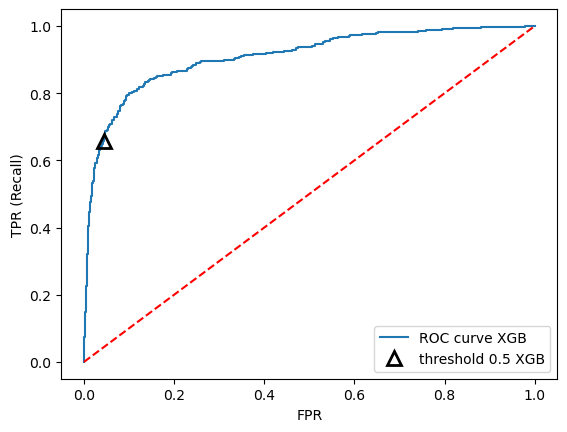

In [51]:
fpr_xgbr, tpr_xgbr, thresholds_xgbr = roc_curve(y_test, predict_proba_xgbr)
plt.plot(fpr_xgbr, tpr_xgbr, label="ROC curve XGB")
plt.xlabel("FPR")
plt.ylabel("TPR (Recall)")
close_default_xgbr = np.argmin(np.abs(thresholds_xgbr - 0.5))
plt.plot(fpr_xgbr[close_default_xgbr], tpr_xgbr[close_default_xgbr], '^', markersize=10, label="threshold 0.5 XGB", fillstyle="none", c='k', mew=2)
plt.legend(loc=4)
plt.plot([0, 1], [0, 1],'r--')
roc_auc_xgbr = roc_auc_score(y_test, predict_proba_xgbr)
print("6. ROC AUC: {:.3f}".format(roc_auc_xgbr))

confusion = confusion_matrix(y_test, pred_xgbr)
print("7. Confusion matrix:\n{}".format(confusion))

print("8. Classification Report:\n ", classification_report(y_test, pred_xgbr, target_names=["No RainTomorrow", "RainTomorrow"]))

#6.Model Evaluation

In [65]:
models_acc = pd.DataFrame({
    'Model': ['KNeighbors', 'DecisionTree', 'RandomForest', 
              'GradientBoosting', 'XGB CLASSFIER'],
    'Accuracy': [acc_Knn, acc_tree, acc_rf, acc_gbrt, acc_xgbr]})
models_acc.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy
4,XGB CLASSFIER,0.881822
2,RandomForest,0.867584
1,DecisionTree,0.842905
3,GradientBoosting,0.839108
0,KNeighbors,0.777883


In [67]:
models_ROC_AUC = pd.DataFrame({
    'Model': ['KNeighbors', 'DecisionTree', 'RandomForest', 
              'GradientBoosting', 'XGB CLASSIFIER'],
    'ROC_AUC': [roc_auc_Knn, roc_auc_tree, roc_auc_rf, roc_auc_gbrt, roc_auc_xgbr]})
models_ROC_AUC.sort_values(by='ROC_AUC', ascending=False)

,Model,ROC_AUC
4,XGB CLASSIFIER,0.909148
2,RandomForest,0.890365
3,GradientBoosting,0.872429
0,KNeighbors,0.792064
1,DecisionTree,0.782618
